# Credit Assignment Table

# Phase 4-5 Credit

| Name	| Task | Hours | 
|-------|------|-------|
| Diego	| Storage czar, hosting photos, organizing + writing | 20 | 
| Aaron	|  Presentations + Writing Final Project | 15 |
| Rithvik	| Presentations + Writing Final Project | 15 |
| Adam	| Tail_Num + Holiday + Airport Outlinks, ML Pipeline, Storing DFs as Parquet |  60 |
| Saket	| Cleaning Pipelines + Improving Efficiency + Tail Num implementation + Flight path Probability  | 35 |

# Phase Leader: Aaron

# Video Link

In [0]:
## Place this cell in any team notebook that needs access to the team cloud storage.


# The following blob storage is accessible to team members only (read and write)
# access key is valid til TTL
# after that you will need to create a new SAS key and authenticate access again via DataBrick command line
secret_scope = "261-fp-scope"
secret_key   = "261-fp-scope-key"    
blob_container  = "dmcdonald-261-fp-container"       # The name of your container created in https://portal.azure.com
storage_account = "dmcdonald" # The name of your Storage account created in https://portal.azure.com
team_blob_url        = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"  #points to the root of your team storage bucket

# the 261 course blob storage is mounted here on the DataBricks workspace.
mids261_mount_path      = "/mnt/mids-w261"

# SAS Token: Grant the team limited access to Azure Storage resources
spark.conf.set(
  f"fs.azure.sas.{blob_container}.{storage_account}.blob.core.windows.net",
  dbutils.secrets.get(scope = secret_scope, key = secret_key)
)
import pandas as pd
pdf = pd.DataFrame([[1, 2, 3, "Jane"], [2, 2,2, None], [12, 12,12, "John"]], columns=["x", "y", "z", "a_string"])
df = spark.createDataFrame(pdf) # Create a Spark dataframe from a pandas DF

# The following can write the dataframe to the team's Cloud Storage  
# Navigate back to your Storage account in https://portal.azure.com, to inspect the partitions/files.
df.write.parquet(f"{team_blob_url}/test", mode='overwrite')



# see what's in the blob storage root folder 
display(dbutils.fs.ls(f"{team_blob_url}"))

path,name,size,modificationTime
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/2015-2017.parquet/,2015-2017.parquet/,0,1690499558000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/20152017/,20152017/,0,1690498711000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/folds/,folds/,0,1691356833000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/saket_delta_Dataset_l160M/,saket_delta_Dataset_l160M/,0,1690946282000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/saket_dev/,saket_dev/,0,1689739190000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/saket_op_delta_Dataset_Final_dataset_12M/,saket_op_delta_Dataset_Final_dataset_12M/,0,1690874411000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/saket_op_delta_Dataset_l4_dataset_12M/,saket_op_delta_Dataset_l4_dataset_12M/,0,1690793020000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/saket_op_delta_Dataset_l4_dataset_12M_with_FL_SURR_KEY/,saket_op_delta_Dataset_l4_dataset_12M_with_FL_SURR_KEY/,0,1690863136000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/saket_op_delta_Dataset_l5_dataset_12M_with_FL_SURR_KEY/,saket_op_delta_Dataset_l5_dataset_12M_with_FL_SURR_KEY/,0,1690795852000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/saket_op_delta_Dataset_l5_dataset_12M_with_FL_SURR_KEY_1/,saket_op_delta_Dataset_l5_dataset_12M_with_FL_SURR_KEY_1/,0,1690798347000


In [0]:
# define base directory that contains all the data
#data_BASE_DIR = "dbfs:/mnt/mids-w261/"
#display(dbutils.fs.ls(f"{data_BASE_DIR}"))

In [0]:
import pyspark.sql.functions as f
from pyspark.sql.types import IntegerType
from pyspark.sql.window import Window
from datetime import datetime, timedelta
import numpy as np


## Feature Engineering Part 1: Previous Flight Delays For Same Aircraft

In [0]:
time_zone_df = pd.read_csv('https://raw.githubusercontent.com/hroptatyr/dateutils/tzmaps/iata.tzmap',sep='\t',header=None)\
                 .rename(columns={0:'IATA',1:'timezone_airport'})
time_zone_df = spark.createDataFrame(time_zone_df)

In [0]:
train_df = train_df.cache()
train_df.count()

In [0]:
from pyspark.sql.functions import broadcast
train_df_or = train_df.join(broadcast(time_zone_df), train_df.origin_iata_code == time_zone_df.IATA)\
    .select(f.col('OP_CARRIER_FL_NUM'), f.col('timezone_airport').alias('origin_tz'), f.col('sched_depart_date_time_UTC'), f.col('TAIL_NUM'))
train_df_ds = train_df.join(broadcast(time_zone_df), train_df.dest_iata_code == time_zone_df.IATA)\
    .withColumnRenamed('timezone_airport', 'dest_tz')
train_df_tz = train_df_ds.join(train_df_or, on = ["OP_CARRIER_FL_NUM", 'sched_depart_date_time_UTC', 'TAIL_NUM'], how = 'inner').cache()

In [0]:
val_df_or = val_df.join(broadcast(time_zone_df), val_df.origin_iata_code == time_zone_df.IATA)\
    .select(f.col('OP_CARRIER_FL_NUM'), f.col('timezone_airport').alias('origin_tz'), f.col('sched_depart_date_time_UTC'), f.col('TAIL_NUM'))
val_df_ds = val_df.join(broadcast(time_zone_df), val_df.dest_iata_code == time_zone_df.IATA)\
    .withColumnRenamed('timezone_airport', 'dest_tz')
val_df_tz = val_df_ds.join(val_df_or, on = ["OP_CARRIER_FL_NUM", 'sched_depart_date_time_UTC', 'TAIL_NUM'], how = 'inner').cache()

In [0]:
val_df_prev_delay = val_df_tz.withColumn('scheduled_dep_time', f.lpad(val_df_tz.CRS_DEP_TIME, 4, '0'))\
                         .withColumn('scheduled_dep_timestamp', f.to_timestamp(f.concat(f.col('FL_DATE'), f.col('scheduled_dep_time')), format='yyyy-MM-ddHHmm'))\
                         .withColumn("hour", f.hour('scheduled_dep_timestamp'))\
                         .withColumn('actual_dep_time', f.lpad(val_df_tz.DEP_TIME, 4, '0'))\
                         .withColumn('actual_dep_timestamp', f.to_timestamp(f.concat(f.col('FL_DATE'), f.col('actual_dep_time')), format='yyyy-MM-ddHHmm'))\
                         .withColumn('scheduled_arr_time', f.lpad(val_df_tz.CRS_ARR_TIME, 4, '0'))\
                         .withColumn('scheduled_arr_timestamp', f.to_timestamp(f.concat(f.col('FL_DATE'), f.col('scheduled_arr_time')), format='yyyy-MM-ddHHmm'))\
                         .withColumn('actual_arr_time', f.lpad(val_df_tz.ARR_TIME, 4, '0'))\
                         .withColumn('actual_arr_timestamp', f.to_timestamp(f.concat(f.col('FL_DATE'), f.col('actual_arr_time')), format='yyyy-MM-ddHHmm'))\
                         .withColumn("earlier_timestamp", (f.unix_timestamp("scheduled_dep_timestamp") - 2*3600).cast('timestamp'))
  # Converting flight times to UTC times
val_df_prev_delay = val_df_prev_delay.withColumn('scheduled_dep_time_UTC', f.to_utc_timestamp(f.col('scheduled_dep_timestamp'), f.col('origin_tz')))\
                                     .withColumn('scheduled_arr_time_UTC', f.to_utc_timestamp(f.col('scheduled_arr_timestamp'), f.col('dest_tz')))\
                                     .withColumn('actual_arr_time_UTC', f.to_utc_timestamp(f.col('actual_arr_timestamp'), f.col('dest_tz')))\
                                     .withColumn('actual_dep_time_UTC', f.to_utc_timestamp(f.col('actual_dep_timestamp'), f.col('origin_tz')))\
                                     .withColumn('earlier_timestamp_UTC', f.to_utc_timestamp(f.col('earlier_timestamp'), f.col('origin_tz')))
                                     
# For prior late arrival window
windowSpec_arr = Window.partitionBy('TAIL_NUM').orderBy('scheduled_arr_time_UTC')
# For prior late departure window
windowSpec_dep = Window.partitionBy('TAIL_NUM').orderBy('scheduled_dep_time_UTC')

val_df_prev_delay = val_df_prev_delay.withColumn('previous_arr_time_UTC', f.lag('scheduled_arr_time_UTC',1, None).over(windowSpec_arr))\
                       .withColumn('preflight_window', (f.unix_timestamp('scheduled_dep_time_UTC') - f.unix_timestamp('previous_arr_time_UTC'))/60)\
                       .withColumn('can_arr_delay', f.when((f.col('preflight_window') < 43200/60 ) & (f.col('preflight_window') > 7200/60), 'yes').otherwise('no'))\
                       .withColumn('prior_arr_delay', f.when((f.col('can_arr_delay') == 'yes') & (f.col('ARR_DELAY') > 0), 1).otherwise(0))\
                       .withColumn('prior_arr_delay', f.when((f.col('preflight_window') < 0), -1).otherwise(f.col('prior_arr_delay')))\
                       .withColumn('previous_flight_delay_status', f.lag('DEP_DEL15', 1, None).over(windowSpec_dep))\
                       .withColumn('prior_dep_delayed', f.when((f.col('can_arr_delay') == 'yes') & (f.col('previous_flight_delay_status') == 1), 1).otherwise(0))\
                       .withColumn('prior_dep_delayed',  f.when((f.col('preflight_window') < 0), -1).otherwise(f.col('prior_dep_delayed'))).cache()

In [0]:
train_df_prev_delay = train_df_tz.withColumn('scheduled_dep_time', f.lpad(train_df_tz.CRS_DEP_TIME, 4, '0'))\
                        .withColumn('scheduled_dep_timestamp', f.to_timestamp(f.concat(f.col('FL_DATE'), f.col('scheduled_dep_time')), format='yyyy-MM-ddHHmm'))\
                        .withColumn("hour", f.hour('scheduled_dep_timestamp'))\
                        .withColumn('actual_dep_time', f.lpad(train_df_tz.DEP_TIME, 4, '0'))\
                        .withColumn('actual_dep_timestamp', f.to_timestamp(f.concat(f.col('FL_DATE'), f.col('actual_dep_time')), format='yyyy-MM-ddHHmm'))\
                        .withColumn('scheduled_arr_time', f.lpad(train_df_tz.CRS_ARR_TIME, 4, '0'))\
                        .withColumn('scheduled_arr_timestamp', f.to_timestamp(f.concat(f.col('FL_DATE'), f.col('scheduled_arr_time')), format='yyyy-MM-ddHHmm'))\
                        .withColumn('actual_arr_time', f.lpad(train_df_tz.ARR_TIME, 4, '0'))\
                        .withColumn('actual_arr_timestamp', f.to_timestamp(f.concat(f.col('FL_DATE'), f.col('actual_arr_time')), format='yyyy-MM-ddHHmm'))\
                        .withColumn("earlier_timestamp", (f.unix_timestamp("scheduled_dep_timestamp") - 2*3600).cast('timestamp'))
# Converting flight times to UTC times
train_df_prev_delay = train_df_prev_delay.withColumn('scheduled_dep_time_UTC', f.to_utc_timestamp(f.col('scheduled_dep_timestamp'), f.col('origin_tz')))\
                                    .withColumn('scheduled_arr_time_UTC', f.to_utc_timestamp(f.col('scheduled_arr_timestamp'), f.col('dest_tz')))\
                                    .withColumn('actual_arr_time_UTC', f.to_utc_timestamp(f.col('actual_arr_timestamp'), f.col('dest_tz')))\
                                    .withColumn('actual_dep_time_UTC', f.to_utc_timestamp(f.col('actual_dep_timestamp'), f.col('origin_tz')))\
                                    .withColumn('earlier_timestamp_UTC', f.to_utc_timestamp(f.col('earlier_timestamp'), f.col('origin_tz')))
                                    
# For prior late arrival window
windowSpec_arr = Window.partitionBy('TAIL_NUM').orderBy('scheduled_arr_time_UTC')
# For prior late departure window
windowSpec_dep = Window.partitionBy('TAIL_NUM').orderBy('scheduled_dep_time_UTC')
 
train_df_prev_delay = train_df_prev_delay.withColumn('previous_arr_time_UTC', f.lag('scheduled_arr_time_UTC',1, None).over(windowSpec_arr))\
                       .withColumn('preflight_window', (f.unix_timestamp('scheduled_dep_time_UTC') - f.unix_timestamp('previous_arr_time_UTC'))/60)\
                       .withColumn('can_arr_delay', f.when((f.col('preflight_window') < 43200/60 ) & (f.col('preflight_window') > 7200/60), 'yes').otherwise('no'))\
                       .withColumn('prior_arr_delay', f.when((f.col('can_arr_delay') == 'yes') & (f.col('ARR_DELAY') > 0), 1).otherwise(0))\
                       .withColumn('prior_arr_delay', f.when((f.col('preflight_window') < 0), -1).otherwise(f.col('prior_arr_delay')))\
                       .withColumn('previous_flight_delay_status', f.lag('DEP_DEL15', 1, None).over(windowSpec_dep))\
                       .withColumn('prior_dep_delayed', f.when((f.col('can_arr_delay') == 'yes') & (f.col('previous_flight_delay_status') == 1), 1).otherwise(0))\
                       .withColumn('prior_dep_delayed',  f.when((f.col('preflight_window') < 0), -1).otherwise(f.col('prior_dep_delayed'))).cache()

In [0]:
train_df_prev_delay = train_df_prev_delay.cache()
train_df_prev_delay.count()

In [0]:
#display(train_df_prev_delay)

In [0]:
# train_df_prev_delay.write.parquet(f"{team_blob_url}/train_delay_v1.parquet") # 2015 - 2018
#val_df_prev_delay.write.parquet(f"{team_blob_url}/val_delay_v1.parquet") # 2019

In [0]:
train_df = spark.read.parquet(f"{team_blob_url}/train_delay_v1.parquet/").cache()
val_df = spark.read.parquet(f"{team_blob_url}/val_delay_v1.parquet/").cache()

In [0]:
#train_df_total.write.parquet(f"{team_blob_url}/train.parquet") # 2015 - 2018
#val_df_total.write.parquet(f"{team_blob_url}/val.parquet") # 2019

In [0]:
train_df = spark.read.parquet(f"{team_blob_url}/train.parquet/").cache()
# train_df.count()

In [0]:
display(train_df)

In [0]:
val_df = spark.read.parquet(f"{team_blob_url}/val.parquet/").cache()
# val_df.count()

In [0]:
total = train_df.agg(f.sum('previous_flight_delay_status')).collect()[0][0]
print(total)

## Feature Engineering Part 2: A flight's distance from a Federal Holiday

In [0]:
# List of Federal Holidays from 2015 to 2019
holidays = [f'{year}-{month:02d}-{day:02d}' 
            for year in range(2015, 2020) 
            for month, day in [(1, 1), (1, 16), (2, 20), (5, 29), (7, 4), 
                               (9, 4), (10, 9), (11, 10), (11, 23), (12, 25)]]

holidays = [datetime.strptime(x, '%Y-%m-%d') for x in holidays]

def add_min_dist_column(df):
    min_diff = f.lit(float('inf'))
    for holiday in holidays:
        diff = f.abs(f.datediff(f.lit(holiday), df['date']))
        min_diff = f.least(min_diff, diff)

    df = df.withColumn('MIN_DIST_FROM_HOLIDAY', min_diff)
    return df
    

# Apply the function to both DataFrames
train_df = add_min_dist_column(train_df_prev_delay).cache()
val_df = add_min_dist_column(val_df_prev_delay).cache()

## Feature Engineering Part 3: Outlinks By Origin Airport

In [0]:
# Function to calculate the number of flights departing from each airport each day and return a groupby object
def add_tail_num_prior_delay(df):
    grp = df.groupBy(*['FL_DATE', 'ORIGIN']).count()
    return grp

In [0]:
train_df.count()

In [0]:
outlink_df = add_tail_num_prior_delay(train_df)
val_outlink_df = add_tail_num_prior_delay(val_df)

In [0]:
outlink_df = outlink_df.withColumnRenamed('count', 'Outlinks')
val_outlink_df = val_outlink_df.withColumnRenamed('count', 'Outlinks')

In [0]:
train_df_with_outlinks = train_df.join(outlink_df, on=['FL_DATE', 'ORIGIN'], how='inner').cache()
#train_df_with_outlinks.count()
val_df_with_outlinks = val_df.join(val_outlink_df, on=['FL_DATE', 'ORIGIN'], how='inner').cache()

In [0]:
#display(val_df_with_outlinks)

In [0]:
train_df = train_df_with_outlinks.cache()
val_df = val_df_with_outlinks.cache()

## Machine Learning Preparation Pipeline

In [0]:
DATE_COLS = ['FL_DATE', 'sched_depart_date_time_UTC','two_hours_prior_depart_UTC']
# Make sure 'DEP_DEL15' is the last value in this list
NUM_FEATURES_COLS = ['FL_DATE', 'HourlyVisibility', 'HourlyWindGustSpeed', 'HourlyWindSpeed', 'DAY_OF_MONTH', 'DAY_OF_WEEK', 'DISTANCE', 'MIN_DIST_FROM_HOLIDAY', 'HourlyAltimeterSetting', 'HourlyDewPointTemperature', 'HourlyDryBulbTemperature', 'HourlySkyConditions', 'HourlyPressureChange', 'previous_flight_delay_status', 'Outlinks', 'DEP_DEL15']
CAT_FEATURES_COLS = ['OP_UNIQUE_CARRIER', 'ORIGIN', 'DEST']
DEPRECATED_COLS = ['origin_airport_lat', 'origin_airport_lon', 'dest_station_lon', 'dest_station_lat']
LABEL = 'DEP_DEL15'

In [0]:
# Exclude the first and last column from the imputation and conversion to float
NUM_FEATURES_COLS_TO_IMPUTE = NUM_FEATURES_COLS[:-1]

# Cast to float type
#train_df = train_df.select(*(f.col(c).cast("float").alias(c) for c in NUM_FEATURES_COLS[1:]), *(f.col(c).alias(c) for c in CAT_FEATURES_COLS)).cache()
train_df = train_df.select(*(f.col(c).alias(c) for c in DATE_COLS),
                           *(f.col(c).cast("float").alias(c) for c in NUM_FEATURES_COLS[1:]), 
                           *(f.col(c).alias(c) for c in CAT_FEATURES_COLS)).cache()

#val_df = val_df.select(*(f.col(c).cast("float").alias(c) for c in NUM_FEATURES_COLS[1:]), *(f.col(c).alias(c) for c in CAT_FEATURES_COLS)).cache()
val_df = val_df.select(*(f.col(c).alias(c) for c in DATE_COLS),
                           *(f.col(c).cast("float").alias(c) for c in NUM_FEATURES_COLS[1:]), 
                           *(f.col(c).alias(c) for c in CAT_FEATURES_COLS)).cache()

In [0]:
from pyspark.ml.feature import OneHotEncoder, StringIndexer, Imputer
from pyspark.ml import Pipeline
from pyspark.ml.feature import VectorAssembler
from pyspark.sql.functions import unix_timestamp

# convert date to Unix timestamp (in seconds)
train_df = train_df.withColumn(NUM_FEATURES_COLS[0], unix_timestamp(NUM_FEATURES_COLS[0]))
val_df = val_df.withColumn(NUM_FEATURES_COLS[0], unix_timestamp(NUM_FEATURES_COLS[0]))


# Imputer for numerical columns
imputer = Imputer(inputCols=NUM_FEATURES_COLS_TO_IMPUTE, 
                  outputCols=[f"{col}_imputed" for col in NUM_FEATURES_COLS_TO_IMPUTE])

# StringIndexer and OneHotEncoder for categorical columns
indexers = [StringIndexer(inputCol=column, outputCol=column+"_index").setHandleInvalid("keep") for column in CAT_FEATURES_COLS]
encoders = [OneHotEncoder(inputCol=column+"_index", outputCol=column+"_ohe", handleInvalid='keep') for column in CAT_FEATURES_COLS]

# Assembling mixed data type transformations
assembler = VectorAssembler(inputCols=[NUM_FEATURES_COLS[0]] + [f"{col}_imputed" for col in NUM_FEATURES_COLS_TO_IMPUTE] + [encoder.getOutputCol() for encoder in encoders], outputCol="features",
                            handleInvalid='skip')

# Pipeline stages
stages = [imputer] + indexers + encoders + [assembler]

# Setup the pipeline
pipeline = Pipeline(stages=stages)

# Fit the pipeline to training data
model = pipeline.fit(train_df)

# Transform the data
train_df = model.transform(train_df).cache()
val_df = model.transform(val_df).cache()

In [0]:
#train_df.write.parquet(f"{team_blob_url}/train_fe_v1", mode='overwrite')
#val_df.write.parquet(f"{team_blob_url}/val_fe_v1", mode='overwrite')

In [0]:
train_texperiment_df = train_df.dropna(subset=['DEP_DEL15']).cache()
val_texperiment_df = val_df.dropna(subset=['DEP_DEL15']).cache()

In [0]:
train_texperiment_df = train_texperiment_df.select(['FL_DATE', 'features', 'DEP_DEL15']).cache()
val_texperiment_df = val_texperiment_df.select(['FL_DATE', 'features', 'DEP_DEL15']).cache()

In [0]:
#train_texperiment_df.write.parquet(f"{team_blob_url}/train_featureVec_fe_v2.parquet") # 2015 - 2018
#val_texperiment_df.write.parquet(f"{team_blob_url}/val_featureVec_fe_v2.parquet") # 2019

In [0]:
train_texperiment_df = spark.read.parquet(f"{team_blob_url}/train_featureVec_fe_v2.parquet/").cache()
val_texperiment_df = spark.read.parquet(f"{team_blob_url}/val_featureVec_fe_v2.parquet/").cache()

In [0]:
display(train_df)

Exception ignored in: <function JavaModelWrapper.__del__ at 0x7f097c9bc1f0>
Traceback (most recent call last):
  File "/databricks/spark/python/pyspark/mllib/common.py", line 152, in __del__
    assert self._sc._gateway is not None
AttributeError: 'MulticlassMetrics' object has no attribute '_sc'


FL_DATE,Elevation,sched_depart_date_time_UTC,two_hours_prior_depart_UTC,ORIGIN,OP_CARRIER_FL_NUM,TAIL_NUM,QUARTER,DAY_OF_MONTH,DAY_OF_WEEK,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DISTANCE,YEAR,MONTH,origin_type,dest_type,previous_flight_delay_status,MIN_DIST_FROM_HOLIDAY,Outlinks,Is_Holiday,FL_ID,dep_Hour,arr_Hour,num_fl_departing_this_hour_ORIGIN,num_fl_arriving_this_hour_ORIGIN,FL_SURR_KEY,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlySkyConditions,HourlyPressureChange,HourlyWindGustSpeed,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyRelativeHumidity,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindSpeed,total_flights_on_fl_date_origin,is_CLR,is_FEW,is_BKN,is_OVC,is_SCT,is_VV,is_X,wind_gusts_mph,precipitation_mm,temperature_fahrenheit,flights_delayed_at_current_origin
2015-01-01,307.8,2015-01-01T12:00:00.000+0000,2015-01-01T10:00:00.000+0000,ATL,17,N019AA,1,1,4,AA,19805,MIA,"Miami, FL",FL,12,Florida,33,700,656,-4.0,0.0,0.0,594.0,2015,1,large_airport,large_airport,null,0.0,740,1,AA_19805_N019AA,12,13,11,15,17179869184,30.33,28,FEW:02 150 SCT:04 200 SCT:04 250,null,0,37,0.00,70,30.35,29.22,10.00,33,000,0,737,0,1,0,0,1,0,0,null,null,51.8,null
2015-01-01,201.8,2015-01-01T18:25:00.000+0000,2015-01-01T16:25:00.000+0000,ORD,374,N3ARAA,1,1,4,AA,19805,LGA,"New York, NY",NY,36,New York,22,1225,1221,-4.0,0.0,0.0,733.0,2015,1,large_airport,large_airport,null,0.0,689,1,AA_19805_N3ARAA,18,20,37,43,1056561955700,29.96,14,SCT:04 75 BKN:07 100 BKN:07 250,+0.03,0,31,0.00,49,29.99,29.24,10.00,26,250,16,684,0,0,1,0,1,0,0,null,null,53.6,null
2015-01-01,170.7,2015-01-02T02:05:00.000+0000,2015-01-02T00:05:00.000+0000,DFW,2498,N3CCAA,1,1,4,AA,19805,CLT,"Charlotte, NC",NC,37,North Carolina,36,2005,2051,46.0,46.0,1.0,936.0,2015,1,large_airport,large_airport,1.0,0.0,788,1,AA_19805_N3CCAA,2,4,56,54,180388628802,30.22,35,FEW:02 4 BKN:07 22 OVC:08 35,null,0,36,0.09,97,30.23,29.57,6.00,36,010,6,618,0,1,1,1,0,0,0,null,2.032,55.4,263
2015-01-01,170.7,2015-01-02T00:05:00.000+0000,2015-01-01T22:05:00.000+0000,DFW,1052,N3EKAA,1,1,4,AA,19805,DCA,"Washington, DC",VA,51,Virginia,38,1805,1820,15.0,15.0,1.0,1192.0,2015,1,large_airport,large_airport,0.0,0.0,788,1,AA_19805_N3EKAA,0,2,50,54,180388631643,30.22,34,BKN:07 6 BKN:07 14 OVC:08 19,null,0,36,0.01,93,30.11,29.57,10.00,35,010,7,618,0,0,1,1,0,0,0,null,0.254,51.8,263
2015-01-01,16.5,2015-01-01T14:45:00.000+0000,2015-01-01T12:45:00.000+0000,SNA,1300,N3FRAA,1,1,4,AA,19805,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,645,645,0.0,0.0,0.0,1205.0,2015,1,large_airport,large_airport,null,0.0,88,1,AA_19805_N3FRAA,14,17,7,0,1606317769994,30.16,26,CLR:00,null,0,57,0.00,30,30.16,30.10,10.00,44,000,0,88,1,0,0,0,0,0,0,null,null,48.2,null
2015-01-01,170.7,2015-01-01T18:35:00.000+0000,2015-01-01T16:35:00.000+0000,DFW,1124,N3GAAA,1,1,4,AA,19805,BOS,"Boston, MA",MA,25,Massachusetts,13,1235,1237,2.0,2.0,0.0,1562.0,2015,1,large_airport,large_airport,null,0.0,788,1,AA_19805_N3GAAA,18,22,41,39,515396076655,30.21,33,OVC:08 4,+0.08,0,35,T,93,30.22,29.57,1.50,34,010,6,618,0,0,0,1,0,0,0,null,0.0,55.4,null
2015-01-01,170.7,2015-01-01T21:55:00.000+0000,2015-01-01T19:55:00.000+0000,DFW,1152,N3GBAA,1,1,4,AA,19805,LGA,"New York, NY",NY,36,New York,22,1555,1627,32.0,32.0,1.0,1389.0,2015,1,large_airport,large_airport,null,0.0,788,1,AA_19805_N3GBAA,21,1,41,49,1305670066838,0,33,5,0.01,0,35,0,93,30.22,29.60,1.49,34,010,8,618,0,0,0,0,0,0,0,null,null,null,null
2015-01-01,8.8,2015-01-01T19:00:00.000+0000,2015-01-01T17:00:00.000+0000,MIA,303,N3GSAA,1,1,4,AA,19805,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1400,1404,4.0,4.0,0.0,1972.0,2015,1,large_airport,large_airport,null,0.0,223,1,AA_19805_N3GSAA,19,0,17,10,541165879874,30.13,67,FEW:02 25 SCT:04 55 BKN:07 90,+0.02,0,79,0.00,67,30.13,30.10,10.00,71,150,10,222,0,1,1,0,1,0,0,null,null,51.8,null
2015-01-01

In [0]:
# Saket features
train_df = spark.read.format("delta").load(f"{team_blob_url}/saket_output_delta_FinalML_10723_minimal/").cache()
val_df = spark.read.format("delta").load(f"{team_blob_url}/saket_output_delta_val_FinalML_10723_minimal/").cache()

+----------------------+------------------+
|Holiday_Distance_Group|    Mean_DEP_DEL15|
+----------------------+------------------+
|             4 or more|0.1793964345113832|
|             3 or less| 0.182147585297772|
+----------------------+------------------+



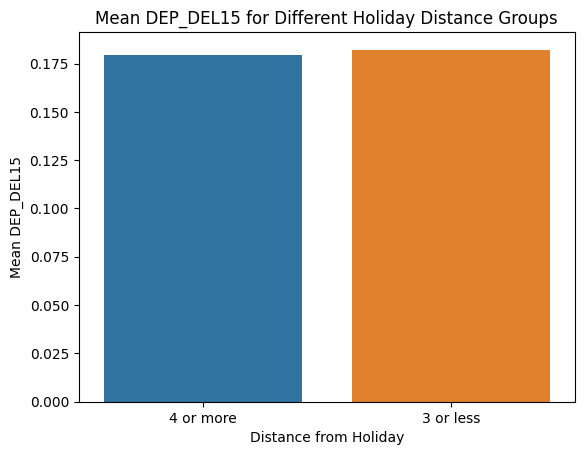

In [0]:
from pyspark.sql import functions as f

# Group by conditions and compute mean
agg_data = train_df.withColumn('Holiday_Distance_Group', 
                               f.when(f.col('MIN_DIST_FROM_HOLIDAY') <= 3, '3 or less') \
                               .otherwise('4 or more')) \
                   .groupBy('Holiday_Distance_Group') \
                   .agg(f.mean('DEP_DEL15').alias('Mean_DEP_DEL15'))

# Show the aggregated data
agg_data.show()

# If you want to visualize this in a bar plot:

# Convert to Pandas for plotting
plot_df = agg_data.toPandas()

# Plot
sns.barplot(x='Holiday_Distance_Group', y='Mean_DEP_DEL15', data=plot_df)
plt.title('Mean DEP_DEL15 for Different Holiday Distance Groups')
plt.ylabel('Mean DEP_DEL15')
plt.xlabel('Distance from Holiday')
plt.show()


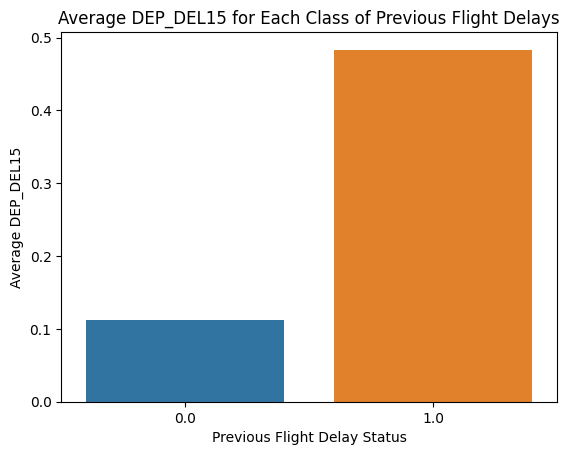

In [0]:
from pyspark.sql import functions as f

# Assuming your DataFrame is named df
agg_data = train_df.groupBy('previous_flight_delay_status').agg(f.mean('DEP_DEL15').alias('avg_DEP_DEL15')).toPandas()

import seaborn as sns
import matplotlib.pyplot as plt

# Plot using seaborn
sns.barplot(x='previous_flight_delay_status', y='avg_DEP_DEL15', data=agg_data)
plt.title('Average DEP_DEL15 for Each Class of Previous Flight Delays')
plt.ylabel('Average DEP_DEL15')
plt.xlabel('Previous Flight Delay Status')
plt.show()

## Prepping the data for Time-Series Modelling

In [0]:
from collections import defaultdict, namedtuple
from datetime import date, datetime, timedelta

In [0]:
BlockSplit = namedtuple("BlockSplit", ["min_date", "train_cut", "val_cut"])

def make_block_splits(min_date, max_date, train_width, val_width):
    """
    Return a list of breakpoints for building the train and validation folds.

    Each item in the list contains a namedtuple of dates: (min_date, train_cut, val_cut).
    The folds can be generated using these cuts as follows: 
    
    * train data is (min_date <= flight_date < train_cut)
    * val data is (train_cut <= flight_date < val_cut)

    Args:
        min_date - the first date to include in the first fold
        max_date - the validation cut of the last fold (i.e. this is the first day
            of the test set and is not included in the folds)
        train_width - the timespan covered by each training set
        val_delta - the timespan covered by each validation set

    Returns:
        a list of ``BlockSplit`` instances
    """
    blocks = list()
    train_min = min_date
    val_cut = min_date
    
    # Loop over and create blocks
    while True:
        train_cut = train_min + train_width
        val_cut = train_cut + val_width
        if train_cut > max_date or val_cut > max_date:
            break
        blocks.append(BlockSplit(train_min, train_cut, val_cut))
        train_min = val_cut
    
    return blocks

def make_folds(df, date_col, splits):
    """
    Make folds using the specified block splits.

    Args:
        df - the dataframe to make folds from
        date_col - the name of a date column to split on
        splits - a list of ``BlockSplit`` instances
    
    Returns:
        a list of (train_df, val_df) tuples
    """
    folds = list()
    for split in splits:
        train_df = df.filter((df[date_col] >= split.min_date) & (df[date_col] < split.train_cut))
        val_df = df.filter((df[date_col] >= split.train_cut) & (df[date_col] < split.val_cut))
        folds.append((train_df, val_df))
    return folds

def save_folds_to_blob(folds, blob_url, fold_name):
    for i, (train_df, val_df) in enumerate(folds):
        dbutils.fs.rm(f"{blob_url}/{fold_name}/train_{i}_df", recurse=True)
        dbutils.fs.rm(f"{blob_url}/{fold_name}/val_{i}_df", recurse=True)
        train_df.write.parquet(f"{blob_url}/{fold_name}/train_{i}_df")
        val_df.write.parquet(f"{blob_url}/{fold_name}/val_{i}_df")

def load_folds_from_blob_and_cache(blob_url, fold_name):
    folds = list()

    # Compute the fold count
    files = dbutils.fs.ls(f"{blob_url}/{fold_name}")
    fold_names = sorted([f.name for f in files if f.name.startswith("train")])
    match = re.match(r"train_(\d+)_df", fold_names[-1])
    fold_count = int(match.group(1)) + 1
    print(f"Loading {fold_count} folds...")

    # Load folds
    for i in range(fold_count):
        train_df = (
            spark.read.parquet(f"{blob_url}/{fold_name}/train_{i}_df")
            .repartition(DEFAULT_PARTITION_COUNT)
            .cache()
        )
        val_df = (
            spark.read.parquet(f"{blob_url}/{fold_name}/val_{i}_df")
            .repartition(DEFAULT_PARTITION_COUNT)
            .cache()
        )
        folds.append((train_df, val_df))
    return folds

In [0]:
# Compute the split points. (This does not actually create the folds -- see next cell.)
splits = make_block_splits(
    min_date = date(2015,1,1), 
    max_date = date(2019,1,1), 
    train_width = timedelta(days=200),
    val_width = timedelta(days=92),
)

for i, split in enumerate(splits):
    print(f"Fold {i} Splits:")
    print(f"  Train: {split.min_date} <= x < {split.train_cut}")
    print(f"    Val: {split.train_cut} <= x < {split.val_cut}")

Fold 0 Splits:
  Train: 2015-01-01 <= x < 2015-07-20
    Val: 2015-07-20 <= x < 2015-10-20
Fold 1 Splits:
  Train: 2015-10-20 <= x < 2016-05-07
    Val: 2016-05-07 <= x < 2016-08-07
Fold 2 Splits:
  Train: 2016-08-07 <= x < 2017-02-23
    Val: 2017-02-23 <= x < 2017-05-26
Fold 3 Splits:
  Train: 2017-05-26 <= x < 2017-12-12
    Val: 2017-12-12 <= x < 2018-03-14
Fold 4 Splits:
  Train: 2018-03-14 <= x < 2018-09-30
    Val: 2018-09-30 <= x < 2018-12-31


In [0]:
def make_folds_and_save(df_in, splits, fold_name="folds"):
    """
    Create training folds and save to blob storage.

    Args:
        df_in - the dataframe to split into folds
        splits - the block splits as returned by make_block_splits()
    """
    if input(f"Are you sure you want to overwrite '{fold_name}'? (y/n)").lower().strip() == "y":
        print("Making train/val folds...")
        df = df_in
        folds = make_folds(df, "FL_DATE", splits)
        save_folds_to_blob(folds, team_blob_url, fold_name)
    else:
        print("Cancelled")

In [0]:
## Grid Search Baseline
def train_baseline(test_df):
    """
    Always predicts that a flight is not delayed.  No training dataframe needed :)

    Parameters:
        test_df: dataframe holding the test set

    returns:
        balanced accuracy score
    """
    df = test_df
    df = df.withColumn('pred', F.lit(0))
    return(balanced_accuracy(df,'pred','IS_DELAYED_1HR'))

def train_baseline_folds(folds):
    """
    Get validation accuracy across all folds

    Parameters:
        folds: sets of train and validation datasets
    
    returns:
        average validation accuracy
    """
    val_results = pd.DataFrame()

    for i, (_, val_df) in enumerate(folds):
        print(f"Training fold {i}: ", end="")
        start = time.time()
        results = train_baseline(val_df)
        elapsed = timedelta(seconds=time.time() - start)
        print(f"DONE. bal_acc:{float(results['bal_acc']):0.3f} (elapsed: {elapsed})")
        val_results = pd.concat([val_results, results], ignore_index=True)
    return(val_results.mean())

def grid_search_baseline(folds):
    results = list()
    for Reg_param in [0.3, 0.2]:
        print(f"baseline fake constant = {Reg_param}")
        val_accuracy = train_baseline_folds(folds)
        results.append([Reg_param] + val_accuracy.tolist())
    results = pd.DataFrame(results)
    results.columns = ["reg_param","bal_acc","prec","recall"]
    return(results)

In [0]:
#train_texperiment_df = train_texperiment_df.withColumn('FL_DATE', f.to_timestamp('FL_DATE'))
#val_texperiment_df = val_texperiment_df.withColumn('FL_DATE', f.to_timestamp('FL_DATE'))

In [0]:
make_folds_and_save(train_texperiment_df, splits, fold_name="folds")

Are you sure you want to overwrite 'folds'? (y/n) y

Making train/val folds...


In [0]:
display(dbutils.fs.ls(f"{team_blob_url}/folds/"))

path,name,size,modificationTime
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/folds/train_0_df/,train_0_df/,0,1691356764000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/folds/train_1_df/,train_1_df/,0,1691356782000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/folds/train_2_df/,train_2_df/,0,1691356799000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/folds/train_3_df/,train_3_df/,0,1691356826000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/folds/train_4_df/,train_4_df/,0,1691356854000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/folds/val_0_df/,val_0_df/,0,1691356772000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/folds/val_1_df/,val_1_df/,0,1691356789000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/folds/val_2_df/,val_2_df/,0,1691356806000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/folds/val_3_df/,val_3_df/,0,1691356833000
wasbs://dmcdonald-261-fp-container@dmcdonald.blob.core.windows.net/folds/val_4_df/,val_4_df/,0,1691356861000


In [0]:
train_df = spark.read.format("delta").load(f"{team_blob_url}/For_Adam_Input_FinalML_10723/").cache()
val_df = spark.read.format("delta").load(f"{team_blob_url}/For_Adam_Input_FinalML_val_10723/").cache()

In [0]:
display(train_df)

HourlyWindGustSpeed,DISTANCE,MIN_DIST_FROM_HOLIDAY,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPressureChange,previous_flight_delay_status,Outlinks,num_fl_departing_this_hour_ORIGIN,num_fl_arriving_this_hour_ORIGIN,HourlyPrecipitation,HourlyRelativeHumidity,HourlySeaLevelPressure,HourlyStationPressure,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindSpeed,total_flights_on_fl_date_origin,temperature_fahrenheit,Is_Holiday,flights_delayed_at_current_origin,DEP_DEL15,DAY_OF_MONTH,DAY_OF_WEEK,OP_UNIQUE_CARRIER,ORIGIN,DEST,is_CLR,is_FEW,is_BKN,is_OVC,is_SCT,is_VV,is_X,dep_Hour,QUARTER,MONTH,origin_type,dest_type
29,266.0,0.0,29.79,11,27,+0.11,0.0,9,1,0,0.00,51,29.81,29.42,22,190,20,5,57.2,1,0.0,0.0,1,4,B6,BTV,JFK,0,0,1,0,1,0,0,16,1,1,medium_airport,large_airport
28,537.0,0.0,29.79,11,28,null,0.0,9,1,0,0.00,49,29.80,29.42,23,190,16,5,53.6,1,0.0,0.0,1,4,EV,BTV,DTW,0,0,1,0,1,0,0,17,1,1,medium_airport,large_airport
26,763.0,0.0,29.79,10,29,+0.01,0.0,9,1,1,0.00,45,29.80,29.42,23,190,15,5,55.4,1,0.0,0.0,1,4,EV,BTV,ORD,0,1,1,1,0,0,0,19,1,1,medium_airport,large_airport
29,266.0,0.0,29.78,10,29,null,0.0,9,1,0,0.00,45,29.79,29.41,23,200,13,5,50.0,1,0.0,0.0,1,4,B6,BTV,JFK,0,0,1,1,0,0,0,20,1,1,medium_airport,large_airport
22,763.0,0.0,29.78,8,30,+0.00,0.0,9,1,2,0.00,39,29.80,29.41,24,190,15,5,53.6,1,0.0,0.0,1,4,EV,BTV,ORD,0,0,0,1,0,0,0,22,1,1,medium_airport,large_airport
0,373.0,0.0,30.34,21,42,null,1.0,83,1,2,0.00,43,30.34,29.87,34,230,3,51,50.0,1,0.0,0.0,1,4,F9,RDU,TTN,0,1,0,0,0,0,0,14,1,1,large_airport,medium_airport
0,427.0,0.0,30.30,27,45,null,0.0,83,2,2,0.00,49,30.30,29.83,38,230,9,51,50.0,1,0.0,0.0,1,4,B6,RDU,JFK,0,1,0,0,0,0,0,15,1,1,large_airport,large_airport
0,427.0,0.0,30.30,27,45,null,0.0,83,2,2,0.00,49,30.30,29.83,38,230,9,51,50.0,1,0.0,0.0,1,4,MQ,RDU,JFK,0,1,0,0,0,0,0,15,1,1,large_airport,large_airport
0,130.0,0.0,30.27,26,49,+0.08,0.0,83,3,3,0.00,41,30.27,29.80,40,260,10,51,51.8,1,0.0,0.0,1,4,US,RDU,CLT,0,1,0,0,0,0,0,16,1,1,large_airport,large_airport
0,1042.0,0.0,30.27,26,49,+0.08,0.0,83,3,3,0.00,41,30.27,29.80,40,260,10,51,51.8,1,0.0,0.0,1,4,EV,RDU,IAH,0,1,0,0,0,0,0,16,1,1,large_airport,large_airport


In [0]:
train_fold_0 = spark.read.parquet(f"{team_blob_url}/folds/train_0_df/").cache()
train_fold_1 = spark.read.parquet(f"{team_blob_url}/folds/train_1_df/").cache()
train_fold_2 = spark.read.parquet(f"{team_blob_url}/folds/train_2_df/").cache()
train_fold_3 = spark.read.parquet(f"{team_blob_url}/folds/train_3_df/").cache()
train_fold_4 = spark.read.parquet(f"{team_blob_url}/folds/train_4_df/").cache()
val_fold_0 = spark.read.parquet(f"{team_blob_url}/folds/val_0_df/").cache()
val_fold_1 = spark.read.parquet(f"{team_blob_url}/folds/val_1_df/").cache()
val_fold_2 = spark.read.parquet(f"{team_blob_url}/folds/val_2_df/").cache()
val_fold_3 = spark.read.parquet(f"{team_blob_url}/folds/val_3_df/").cache()
val_fold_4 = spark.read.parquet(f"{team_blob_url}/folds/val_4_df/").cache()

In [0]:
train_texperiment_df = train_df.dropna(subset=['DEP_DEL15']).cache()
val_texperiment_df = val_df.dropna(subset=['DEP_DEL15']).cache()
train_texperiment_df = train_texperiment_df.select(['FL_DATE', 'features', 'DEP_DEL15']).cache()
val_texperiment_df = val_texperiment_df.select(['FL_DATE', 'features', 'DEP_DEL15']).cache()

## Running the Models-I.I.D

In [0]:
# Import models, param search, and evaluation metrics
from pyspark.ml.tuning import CrossValidator
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.classification import GBTClassifier
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from pyspark.ml.tuning import ParamGridBuilder

evaluator = BinaryClassificationEvaluator(rawPredictionCol="rawPrediction", labelCol='DEP_DEL15', metricName="areaUnderROC")

In [0]:
train_tuning = train_texperiment_df.sample(0.1).cache()
val_tuning = val_texperiment_df.sample(0.1).cache()

In [0]:
# Instantiate Logistic Regression
lr = LogisticRegression(featuresCol='features', labelCol='DEP_DEL15')

# Set up grid for Logistic Regression
lr_paramGrid = (ParamGridBuilder()
             .addGrid(lr.regParam, [0.1, 0.01])
             .addGrid(lr.elasticNetParam, [0.0, 0.5, 1.0])
             .build())

# Perform grid search
lr_crossval = CrossValidator(estimator=lr,
                          estimatorParamMaps=lr_paramGrid,
                          evaluator=evaluator,
                          numFolds=5)  

# Train and evaluate Model
lrModel = lr.fit(train_texperiment_df)
#lr_cvModel = lr_crossval.fit(train_texperiment_df)
print('Logistic Regression Training AUC: ', evaluator.evaluate(lrModel.transform(train_texperiment_df)))
print('Logistic Regression Classification AUC: ', evaluator.evaluate(lrModel.transform(val_texperiment_df)))

Logistic Regression Training AUC:  0.7530369559491383
Logistic Regression Classification AUC:  0.7456489462506989


In [0]:
# Instantiate Random Forest Classifier  
rf = RandomForestClassifier(featuresCol='features', labelCol='DEP_DEL15', numTrees=20, maxDepth=10)

# # Set up grid for RandomForestClassifier
# rf_paramGrid = (ParamGridBuilder()
#              .addGrid(rf.numTrees, [10, 20])
#              .addGrid(rf.maxDepth, [5, 10])
#              .build())

# # Perform grid search
# rf_crossval = CrossValidator(estimator=rf,
#                           estimatorParamMaps=rf_paramGrid,
#                           evaluator=evaluator,
#                           numFolds=5)  

# Evaluate Model
rfModel = rf.fit(train_texperiment_df)
#rf_cvModel = rf_crossval.fit(train_texperiment_df)
print('Random Forest Training AUC: ', evaluator.evaluate(rf_cvModel.transform(train_texperiment_df)))
print('Random Forest Classification AUC: ', evaluator.evaluate(rf_cvModel.transform(val_texperiment_df)))

In [0]:
# Instantiate Gradient Boosted Tree Classifier
gbt = GBTClassifier(featuresCol='features', labelCol='DEP_DEL15', maxIter=25, maxDepth=10, stepSize=0.05)

# Set up grid for GBTClassifier
gbt_paramGrid = (ParamGridBuilder()
             .addGrid(gbt.maxIter, [10, 20])
             .addGrid(gbt.maxDepth, [5, 10])
             .build())

# Perform grid search
gbt_crossval = CrossValidator(estimator=gbt,
                          estimatorParamMaps=gbt_paramGrid,
                          evaluator=evaluator,
                          numFolds=5)  

gbtModel = gbt.fit(train_texperiment_df)

# Evaluate Model
#gbt_cvModel = gbt_crossval.fit(train_texperiment_df)
print('GBT Training AUC: ', evaluator.evaluate(gbtModel.transform(train_texperiment_df)))
print('GBT Classifier AUC: ', evaluator.evaluate(gbtModel.transform(val_texperiment_df)))


GBT Training AUC:  0.7758855793506503
GBT Classifier AUC:  0.7620413337726963


## Running the Model-Time Series

In [0]:
# Spark Session, Pipeline, Functions, and Metrics
from pyspark import SparkContext, SparkConf
from pyspark.sql import SQLContext
from pyspark.ml.feature import OneHotEncoder, StringIndexer, StandardScaler, VectorAssembler
from pyspark.ml import Pipeline
from pyspark.sql.functions import rand
from pyspark.mllib.evaluation import MulticlassMetrics

# Keras / Deep Learning
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation
from keras import optimizers, regularizers, metrics
from keras.optimizers import Adam

# Elephas for Deep Learning on Spark
#from elephas.ml_model import ElephasEstimator

In [0]:
train_texperiment_df = train_texperiment_df.withColumnRenamed('DEP_DEL15', 'label')

In [0]:
train_fold_0 = train_fold_0.withColumnRenamed('DEP_DEL15', 'label')

In [0]:
## LSTM Implementation

# Imports
import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.metrics import Recall
from keras.optimizers import Adam
from elephas.ml_model import ElephasEstimator
from pyspark.ml.linalg import Vectors
from elephas.spark_model import SparkModel
import keras.saving.legacy

# Instantiate the LSTM
model = Sequential()
model.add(LSTM(30, activation='relu', input_shape=(None, 1)))
model.add(Dense(1))
model.compile(optimizer=Adam(), loss='binary_crossentropy')

optimizer_conf = Adam(lr = 0.01)
opt_conf = optimizers.serialize(optimizer_conf)

# Implement LSTM model
estimator = ElephasEstimator()
estimator.set_keras_model_config(model.to_json())
estimator.set_num_workers(8)
estimator.set_epochs(2)
estimator.set_batch_size(128)
estimator.set_verbosity(1)
estimator.set_validation_split(0.15)
estimator.set_categorical_labels(False)
estimator.set_loss('binary_crossentropy')
estimator.set_optimizer_config(opt_conf)
estimator.set_mode("synchronous")

pipeline = Pipeline(stages=[estimator])

# Fit on training
fitted_pipeline = pipeline.fit(train_fold_0.sample(0.5))

/databricks/python/lib/python3.10/site-packages/keras/optimizers/optimizer_v2/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


>>> Fit model
>>> Synchronous training complete.


In [0]:
#val_fold_0 = val_fold_0.withColumnRenamed('DEP_DEL15', 'label')

In [0]:
#prediction = fitted_pipeline.transform(train_fold_0)
#pnl = prediction.select("label", "prediction").cache()
# prediction_and_label = pnl.rdd.map(lambda row: (row.prediction, row.label))
# metrics = MulticlassMetrics(prediction_and_label)